In [1]:
import os
import pickle
import numpy as np
import pandas as pd

split_pkl = "./data/TCGA_GBMLGG/splits/gbmlgg15cv_all_st_patches_512_0_0_1_compass.pkl"
data_all = pickle.load(open(split_pkl, "rb"))

cv_splits = data_all["cv_splits"]   # dict: fold -> {'train':..., 'val':..., 'test':...}
pat2img   = data_all["pat2img"]     # dict: patient_id -> list of patch filenames

print("Number of folds:", len(cv_splits))
print("Fold keys:", cv_splits.keys())


Number of folds: 15
Fold keys: dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15])


In [2]:
ckpt_dir = "./checkpoints/TCGA_GBMLGG/surv_compass_omic_gates_bi_ff/pathomic_fusion/"
chosen_epoch = 10  


In [3]:
def build_patch_df_for_fold(fold_key, epoch):
    """Return a df with one row per patch in the TEST set of this fold & epoch."""
    fold_info = cv_splits[fold_key]
    test_info = fold_info["test"]

    x_patname = np.array(test_info["x_patname"])    # (num_patches,)
    x_path_feat = np.array(test_info["x_path"])     # (num_patches, feat_dim) or (num_patches, n, d)

    # Flatten if needed
    if x_path_feat.ndim == 3:
        N = x_path_feat.shape[0]
        x_path_feat = x_path_feat.reshape(N, -1)

    path_cols = [f"path_{i}" for i in range(x_path_feat.shape[1])]
    df_path = pd.DataFrame(x_path_feat, columns=path_cols)

    # load gates and predictions for this fold & epoch
    gate_f = os.path.join(ckpt_dir, f"pathomic_fusion_{fold_key}_patch_{epoch}_gate_test.pkl")
    pred_f = os.path.join(ckpt_dir, f"pathomic_fusion_{fold_key}_patch_{epoch}_pred_test.pkl")

    gates = np.asarray(pickle.load(open(gate_f, "rb")))   # shape: (num_patches, num_gates)
    pred_obj = pickle.load(open(pred_f, "rb"))
    risk  = np.asarray(pred_obj[0])
    time_ = np.asarray(pred_obj[1])
    censor = np.asarray(pred_obj[2])

    assert gates.shape[0] == x_patname.shape[0] == x_path_feat.shape[0] == risk.shape[0]

    df_patch_fold = pd.DataFrame({
        "patient_id": x_patname,
        "risk": risk,
        "time": time_,
        "censor": censor,
    })

    # add path features
    df_patch_fold = pd.concat([df_patch_fold, df_path], axis=1)

    # add gate columns
    for i in range(gates.shape[1]):
        df_patch_fold[f"gate_{i}"] = gates[:, i]

    # add fold & epoch info
    df_patch_fold["fold"] = fold_key
    df_patch_fold["epoch"] = epoch

    return df_patch_fold


In [4]:
df_all_list = []

for fold_key in sorted(cv_splits.keys()):
    print(f"Loading fold {fold_key} at epoch {chosen_epoch}...")
    df_f = build_patch_df_for_fold(fold_key, chosen_epoch)
    df_all_list.append(df_f)

df_patch_all = pd.concat(df_all_list, ignore_index=True)
print("df_patch_all shape:", df_patch_all.shape)
print(df_patch_all.head())


Loading fold 1 at epoch 10...
Loading fold 2 at epoch 10...
Loading fold 3 at epoch 10...
Loading fold 4 at epoch 10...
Loading fold 5 at epoch 10...
Loading fold 6 at epoch 10...
Loading fold 7 at epoch 10...
Loading fold 8 at epoch 10...
Loading fold 9 at epoch 10...
Loading fold 10 at epoch 10...
Loading fold 11 at epoch 10...
Loading fold 12 at epoch 10...
Loading fold 13 at epoch 10...
Loading fold 14 at epoch 10...
Loading fold 15 at epoch 10...
df_patch_all shape: (24435, 70)
     patient_id      risk   time  censor  path_0  path_1    path_2  path_3  \
0  TCGA-06-0141  2.669885  313.0     1.0     0.0     0.0  0.722127     0.0   
1  TCGA-06-0141  2.761713  313.0     1.0     0.0     0.0  0.896777     0.0   
2  TCGA-06-0141  2.218584  313.0     1.0     0.0     0.0  0.283463     0.0   
3  TCGA-06-0141  2.755001  313.0     1.0     0.0     0.0  0.892059     0.0   
4  TCGA-06-0141  2.724126  313.0     1.0     0.0     0.0  0.828550     0.0   

     path_4  path_5  ...   gate_24  gate_25

In [5]:
gate_col = "gate_31"

idx_top_per_patient = df_patch_all.groupby("patient_id")[gate_col].idxmax()
top_patch_per_patient = df_patch_all.loc[idx_top_per_patient]

top4 = top_patch_per_patient.sort_values(by=gate_col, ascending=False).head(4)
print(top4[["patient_id", "fold", gate_col]])


         patient_id  fold   gate_31
15930  TCGA-HT-A5RC    10  0.837977
14889  TCGA-06-0156    10  0.836272
14940  TCGA-06-0644    10  0.827388
9712   TCGA-VM-A8C9     6  0.793515


In [6]:
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

IMG_ROOT = Path("./data/TCGA_GBMLGG/all_st_patches_512")

def safe_get_fname_for_row(row, df_all, pat2img):
    pid = row["patient_id"]
    fold = row["fold"]
    
    # recompute patch_idx within (patient, fold)
    df_pf = df_all[(df_all["patient_id"] == pid) & (df_all["fold"] == fold)].copy()
    df_pf["patch_idx_local"] = df_pf.groupby(["patient_id", "fold"]).cumcount()
    
    # find this row's local index
    local_idx = df_pf.index.get_loc(row.name)  # position within df_pf
    patch_idx = df_pf.iloc[local_idx]["patch_idx_local"]
    
    n = len(pat2img[pid])
    if patch_idx >= n:
        print(f"[WARN] {pid} fold {fold}: patch_idx {patch_idx} >= {n}, clipping to {n-1}")
        patch_idx = n - 1
    
    return pat2img[pid][patch_idx]

# build img_path only for top4
top4 = top4.copy()
top4["fname"] = top4.apply(lambda r: safe_get_fname_for_row(r, df_patch_all, pat2img), axis=1)
top4["img_path"] = top4["fname"].apply(lambda f: IMG_ROOT / f)

print(top4[["patient_id", "fold", gate_col, "fname"]])


         patient_id  fold   gate_31  \
15930  TCGA-HT-A5RC    10  0.837977   
14889  TCGA-06-0156    10  0.836272   
14940  TCGA-06-0644    10  0.827388   
9712   TCGA-VM-A8C9     6  0.793515   

                                                   fname  
15930  TCGA-HT-A5RC-01Z-00-DX1.6E1C0CF0-7D7D-4F5B-8D6...  
14889  TCGA-06-0156-01Z-00-DX1.1303eb2c-6cf6-4173-804...  
14940  TCGA-06-0644-01Z-00-DX1.bbce7e5c-6df3-4963-ac7...  
9712   TCGA-VM-A8C9-01Z-00-DX4.20D5EE02-3CD2-45C4-AF7...  


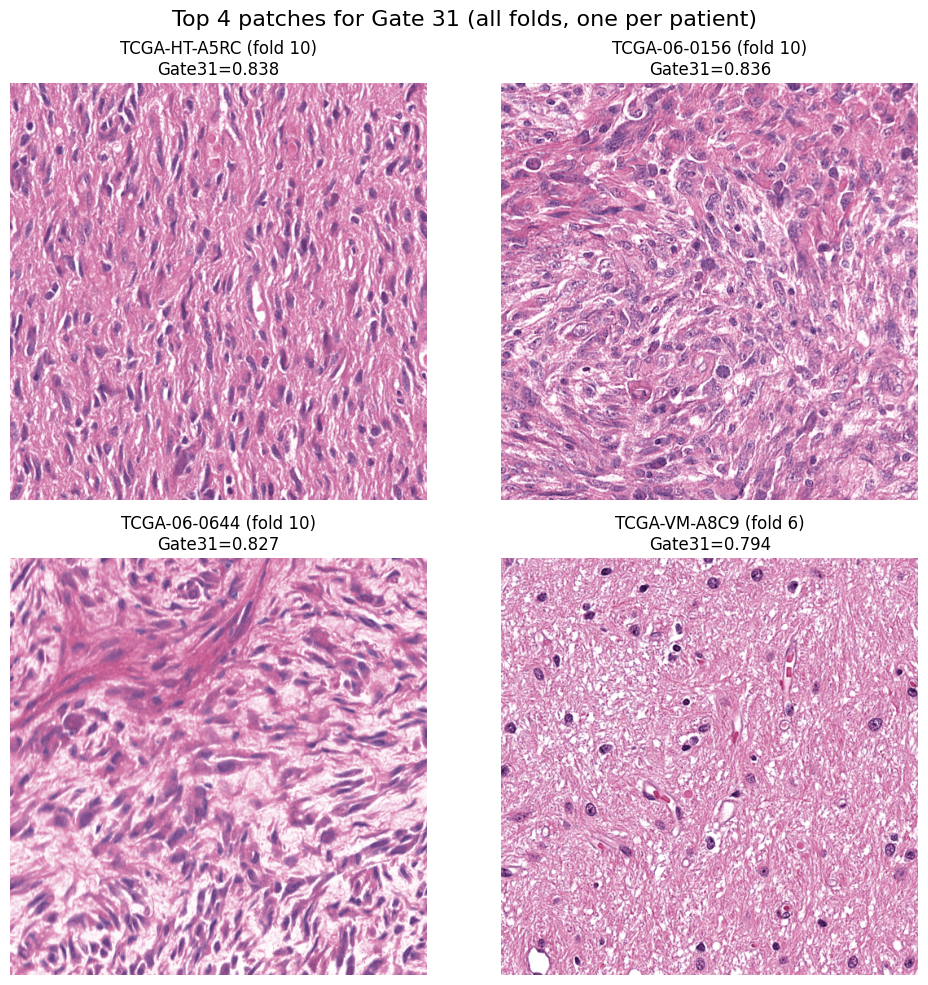

In [7]:
plt.figure(figsize=(10, 10))

for i, (_, row) in enumerate(top4.iterrows()):
    img = Image.open(row["img_path"])
    plt.subplot(2, 2, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{row['patient_id']} (fold {row['fold']})\nGate31={row[gate_col]:.3f}")

plt.suptitle("Top 4 patches for Gate 31 (all folds, one per patient)", fontsize=16)
plt.tight_layout()
plt.show()


In [8]:
gate_col = "gate_16"

idx_top_per_patient = df_patch_all.groupby("patient_id")[gate_col].idxmax()
top_patch_per_patient = df_patch_all.loc[idx_top_per_patient]

top4 = top_patch_per_patient.sort_values(by=gate_col, ascending=False).head(4)
print(top4[["patient_id", "fold", gate_col]])


         patient_id  fold   gate_16
10276  TCGA-DU-7008     7  0.999812
10194  TCGA-DH-5143     7  0.998618
9917   TCGA-27-1830     7  0.997193
11268  TCGA-TM-A84M     7  0.990931


In [9]:
top4 = top4.copy()
top4["fname"] = top4.apply(lambda r: safe_get_fname_for_row(r, df_patch_all, pat2img), axis=1)
top4["img_path"] = top4["fname"].apply(lambda f: IMG_ROOT / f)

print(top4[["patient_id", "fold", gate_col, "fname"]])


         patient_id  fold   gate_16  \
10276  TCGA-DU-7008     7  0.999812   
10194  TCGA-DH-5143     7  0.998618   
9917   TCGA-27-1830     7  0.997193   
11268  TCGA-TM-A84M     7  0.990931   

                                                   fname  
10276  TCGA-DU-7008-01Z-00-DX1.C4A4B091-9F79-4B12-AAC...  
10194  TCGA-DH-5143-01Z-00-DX1.DD05DCF6-FF16-47A3-B3E...  
9917   TCGA-27-1830-01Z-00-DX3.def849be-436e-4c2f-b26...  
11268  TCGA-TM-A84M-01Z-00-DX1.40AFB31C-EC85-4BC2-9C6...  


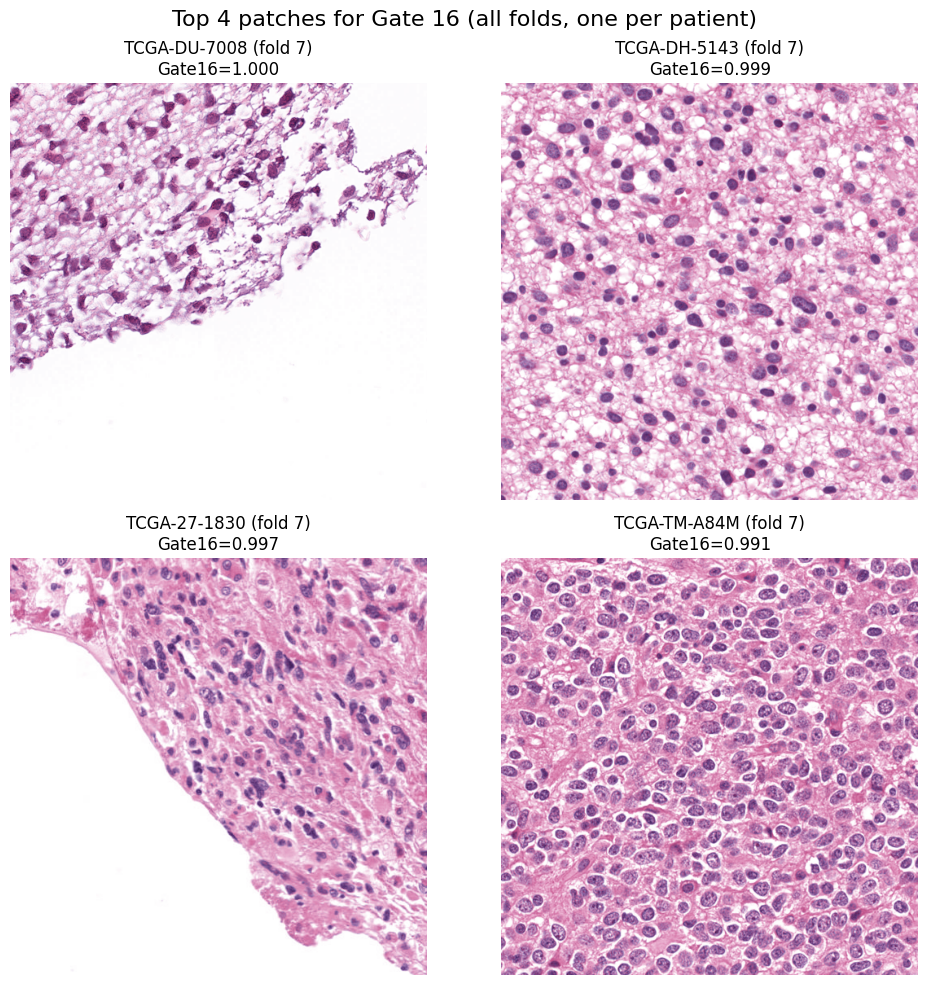

In [11]:
plt.figure(figsize=(10, 10))

for i, (_, row) in enumerate(top4.iterrows()):
    img = Image.open(row["img_path"])
    plt.subplot(2, 2, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{row['patient_id']} (fold {row['fold']})\nGate16={row[gate_col]:.3f}")

plt.suptitle("Top 4 patches for Gate 16 (all folds, one per patient)", fontsize=16)
plt.tight_layout()
plt.show()


         patient_id  fold   gate_25
10276  TCGA-DU-7008     7  0.994803
22422  TCGA-HT-7620    14  0.988152
12101  TCGA-EZ-7264     8  0.985595
12913  TCGA-TM-A84M     8  0.984788
         patient_id  fold   gate_25  \
10276  TCGA-DU-7008     7  0.994803   
22422  TCGA-HT-7620    14  0.988152   
12101  TCGA-EZ-7264     8  0.985595   
12913  TCGA-TM-A84M     8  0.984788   

                                                   fname  
10276  TCGA-DU-7008-01Z-00-DX1.C4A4B091-9F79-4B12-AAC...  
22422  TCGA-HT-7620-01Z-00-DX5.E88271BE-B362-4F17-96D...  
12101  TCGA-EZ-7264-01Z-00-DX1.80a61d74-77d9-4998-bb5...  
12913  TCGA-TM-A84M-01Z-00-DX1.40AFB31C-EC85-4BC2-9C6...  


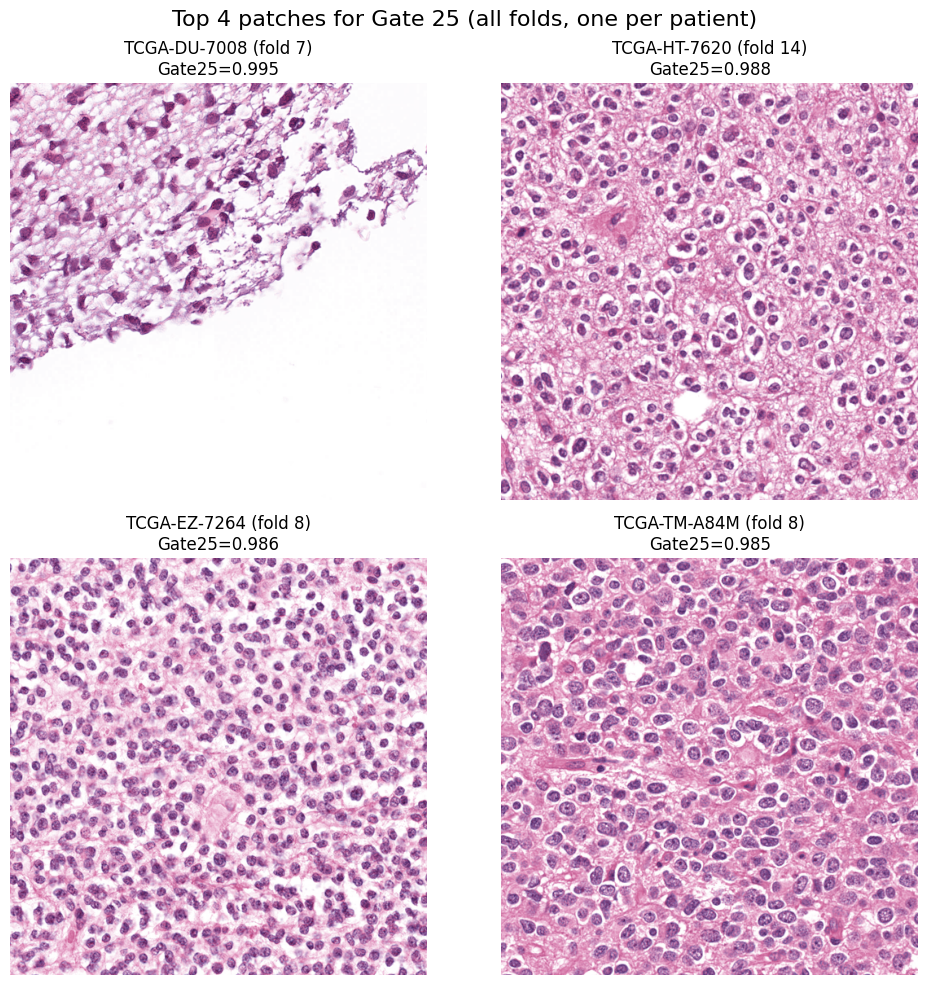

In [13]:
gate_col = "gate_25"

idx_top_per_patient = df_patch_all.groupby("patient_id")[gate_col].idxmax()
top_patch_per_patient = df_patch_all.loc[idx_top_per_patient]

top4 = top_patch_per_patient.sort_values(by=gate_col, ascending=False).head(4)
print(top4[["patient_id", "fold", gate_col]])

top4 = top4.copy()
top4["fname"] = top4.apply(lambda r: safe_get_fname_for_row(r, df_patch_all, pat2img), axis=1)
top4["img_path"] = top4["fname"].apply(lambda f: IMG_ROOT / f)

print(top4[["patient_id", "fold", gate_col, "fname"]])

plt.figure(figsize=(10, 10))

for i, (_, row) in enumerate(top4.iterrows()):
    img = Image.open(row["img_path"])
    plt.subplot(2, 2, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{row['patient_id']} (fold {row['fold']})\nGate25={row[gate_col]:.3f}")

plt.suptitle("Top 4 patches for Gate 25 (all folds, one per patient)", fontsize=16)
plt.tight_layout()
plt.show()


         patient_id  fold   gate_26
10276  TCGA-DU-7008     7  0.999670
9917   TCGA-27-1830     7  0.997440
10194  TCGA-DH-5143     7  0.993215
17481  TCGA-HT-7620    11  0.986174
         patient_id  fold   gate_26  \
10276  TCGA-DU-7008     7  0.999670   
9917   TCGA-27-1830     7  0.997440   
10194  TCGA-DH-5143     7  0.993215   
17481  TCGA-HT-7620    11  0.986174   

                                                   fname  
10276  TCGA-DU-7008-01Z-00-DX1.C4A4B091-9F79-4B12-AAC...  
9917   TCGA-27-1830-01Z-00-DX3.def849be-436e-4c2f-b26...  
10194  TCGA-DH-5143-01Z-00-DX1.DD05DCF6-FF16-47A3-B3E...  
17481  TCGA-HT-7620-01Z-00-DX5.E88271BE-B362-4F17-96D...  


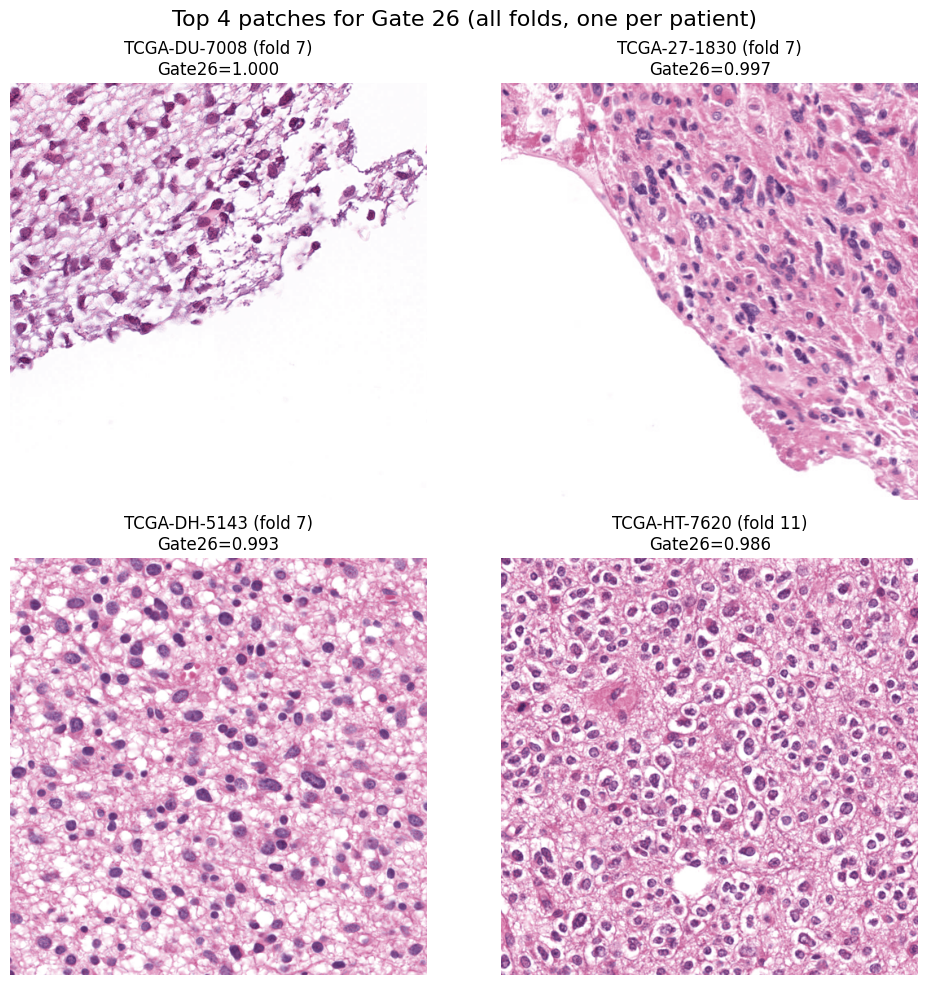

In [14]:
gate_col = "gate_26"

idx_top_per_patient = df_patch_all.groupby("patient_id")[gate_col].idxmax()
top_patch_per_patient = df_patch_all.loc[idx_top_per_patient]

top4 = top_patch_per_patient.sort_values(by=gate_col, ascending=False).head(4)
print(top4[["patient_id", "fold", gate_col]])

top4 = top4.copy()
top4["fname"] = top4.apply(lambda r: safe_get_fname_for_row(r, df_patch_all, pat2img), axis=1)
top4["img_path"] = top4["fname"].apply(lambda f: IMG_ROOT / f)

print(top4[["patient_id", "fold", gate_col, "fname"]])

plt.figure(figsize=(10, 10))

for i, (_, row) in enumerate(top4.iterrows()):
    img = Image.open(row["img_path"])
    plt.subplot(2, 2, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{row['patient_id']} (fold {row['fold']})\nGate26={row[gate_col]:.3f}")

plt.suptitle("Top 4 patches for Gate 26 (all folds, one per patient)", fontsize=16)
plt.tight_layout()
plt.show()


        patient_id  fold   gate_13
1417  TCGA-06-0174     2  0.980326
1024  TCGA-HT-A5RC     1  0.974434
1635  TCGA-14-0789     2  0.971957
1950  TCGA-DU-7015     2  0.968272
        patient_id  fold   gate_13  \
1417  TCGA-06-0174     2  0.980326   
1024  TCGA-HT-A5RC     1  0.974434   
1635  TCGA-14-0789     2  0.971957   
1950  TCGA-DU-7015     2  0.968272   

                                                  fname  
1417  TCGA-06-0174-01Z-00-DX3.23b6e12e-dfc1-4c6f-903...  
1024  TCGA-HT-A5RC-01Z-00-DX1.6E1C0CF0-7D7D-4F5B-8D6...  
1635  TCGA-14-0789-01Z-00-DX4.76e3eef7-b6ee-45aa-9ad...  
1950  TCGA-DU-7015-01Z-00-DX1.E604489D-E82C-4129-9CD...  


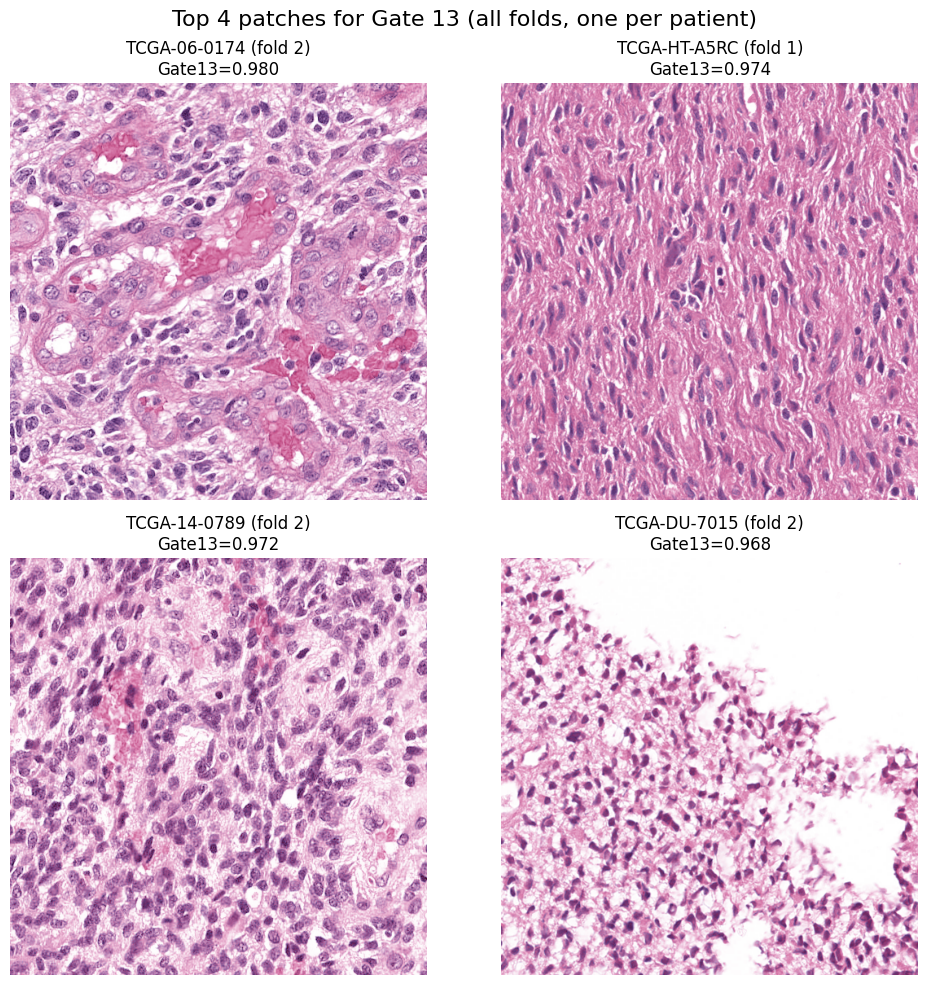

In [15]:
gate_col = "gate_13"

idx_top_per_patient = df_patch_all.groupby("patient_id")[gate_col].idxmax()
top_patch_per_patient = df_patch_all.loc[idx_top_per_patient]

top4 = top_patch_per_patient.sort_values(by=gate_col, ascending=False).head(4)
print(top4[["patient_id", "fold", gate_col]])

top4 = top4.copy()
top4["fname"] = top4.apply(lambda r: safe_get_fname_for_row(r, df_patch_all, pat2img), axis=1)
top4["img_path"] = top4["fname"].apply(lambda f: IMG_ROOT / f)

print(top4[["patient_id", "fold", gate_col, "fname"]])

plt.figure(figsize=(10, 10))

for i, (_, row) in enumerate(top4.iterrows()):
    img = Image.open(row["img_path"])
    plt.subplot(2, 2, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{row['patient_id']} (fold {row['fold']})\nGate13={row[gate_col]:.3f}")

plt.suptitle("Top 4 patches for Gate 13 (all folds, one per patient)", fontsize=16)
plt.tight_layout()
plt.show()


         patient_id  fold   gate_23
14940  TCGA-06-0644    10  0.940556
14889  TCGA-06-0156    10  0.936513
15930  TCGA-HT-A5RC    10  0.932882
14935  TCGA-06-0190    10  0.898187
         patient_id  fold   gate_23  \
14940  TCGA-06-0644    10  0.940556   
14889  TCGA-06-0156    10  0.936513   
15930  TCGA-HT-A5RC    10  0.932882   
14935  TCGA-06-0190    10  0.898187   

                                                   fname  
14940  TCGA-06-0644-01Z-00-DX1.bbce7e5c-6df3-4963-ac7...  
14889  TCGA-06-0156-01Z-00-DX1.1303eb2c-6cf6-4173-804...  
15930  TCGA-HT-A5RC-01Z-00-DX1.6E1C0CF0-7D7D-4F5B-8D6...  
14935  TCGA-06-0190-01Z-00-DX1.84da294a-81f2-4820-b72...  


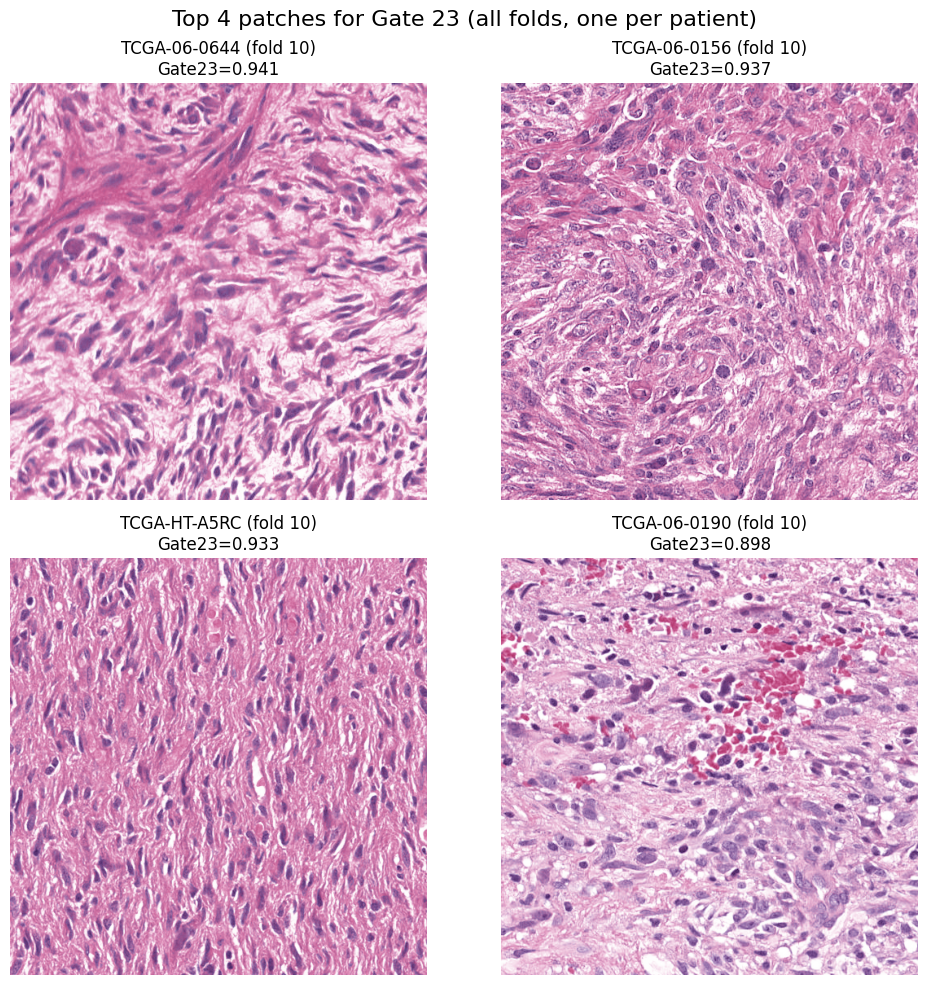

In [16]:
gate_col = "gate_23"

idx_top_per_patient = df_patch_all.groupby("patient_id")[gate_col].idxmax()
top_patch_per_patient = df_patch_all.loc[idx_top_per_patient]

top4 = top_patch_per_patient.sort_values(by=gate_col, ascending=False).head(4)
print(top4[["patient_id", "fold", gate_col]])

top4 = top4.copy()
top4["fname"] = top4.apply(lambda r: safe_get_fname_for_row(r, df_patch_all, pat2img), axis=1)
top4["img_path"] = top4["fname"].apply(lambda f: IMG_ROOT / f)

print(top4[["patient_id", "fold", gate_col, "fname"]])

plt.figure(figsize=(10, 10))

for i, (_, row) in enumerate(top4.iterrows()):
    img = Image.open(row["img_path"])
    plt.subplot(2, 2, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{row['patient_id']} (fold {row['fold']})\nGate23={row[gate_col]:.3f}")

plt.suptitle("Top 4 patches for Gate 23 (all folds, one per patient)", fontsize=16)
plt.tight_layout()
plt.show()
